In [1]:
import os

import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import hvplot.pandas  # noqa

import xarray as xr


import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Polygon

%matplotlib inline
from matplotlib import pyplot as plt
import hvplot.pandas
import holoviews as hv
#
#import pynsitu as pin
#from pynsitu.maps import crs
#import taos.sensors as se

In [2]:
def read_carthe_drifters(file):
    
    df = pd.read_csv(file, parse_dates=[1])
    
    df = (df
          .rename(columns=dict(DeviceName="id", DeviceDateTime="time", 
                               Latitude="latitude", Longitude="longitude"))
          .sort_values("id")
         )
    df = df.set_index("id")
        
    return df

---

## Load drifters trajectories

`drifters_bin.csv` is a binary csv file and it was converted into an ascii csv file with:

```
cat drifters_bin.csv | tr -d '\0' > drifters.csv
```



In [4]:
drifter_file = os.path.join('/Users/mdemol/code/carthe_noise', "carthe_noise_ok.csv")
df = read_carthe_drifters(drifter_file).reset_index().set_index('time').sort_values('time')
df.head()

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude
time,,,,,,,,
2023-03-07 10:10:14,0-4351906,GOOD,0-4351906,0,0,3,48.357964,-4.560463
2023-03-07 10:11:03,0-4388557,GOOD,0-4388557,0,0,3,48.357943,-4.560592
2023-03-07 10:11:18,0-4351902,GOOD,0-4351902,0,0,3,48.357922,-4.560485
2023-03-07 10:11:41,0-4367307,GOOD,0-4367307,0,0,3,48.357911,-4.560463
2023-03-07 10:11:42,0-4367707,GOOD,0-4367707,0,0,3,48.357922,-4.560378


## 0.0 values to nan values
0.0 values on some trajectories when gps quality =1 

In [4]:
df[df.GpsQuality != 3]

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude
time,,,,,,,,
2023-03-07 13:30:28,0-4367706,GOOD,0-4367706,0,1,1,0.000000,0.00000
2023-03-07 16:44:55,0-4367310,GOOD,0-4367310,0,1,1,0.000000,0.00000
2023-03-07 18:49:27,0-4351902,GOOD,0-4351902,0,1,1,0.000000,0.00000
2023-03-07 20:21:44,0-4367707,GOOD,0-4367707,0,1,1,0.000000,0.00000
2023-03-08 18:38:41,0-4351902,GOOD,0-4351902,0,1,1,0.000000,0.00000
2023-03-08 18:47:46,0-4388635,GOOD,0-4388635,0,0,2,48.357814,-4.56042
2023-03-08 19:08:38,0-4351902,GOOD,0-4351902,0,1,1,0.000000,0.00000
2023-03-08 20:42:54,0-4388635,GOOD,0-4388635,0,1,1,0.000000,0.00000
2023-03-08 21:27:46,0-4388620,GOOD,0-4388620,0,1,1,0.000000,0.00000


In [5]:
df = df[df.GpsQuality!=1]

In [6]:
ids = list(df.id.unique())

print("drifter id's in data file:")
print(ids, len(ids))

drifter id's in data file:
['0-4351906', '0-4388557', '0-4351902', '0-4367307', '0-4367707', '0-4356534', '0-4367310', '0-4367706', '0-4367683', '0-4351945', '0-4356456', '0-4351296', '0-4388554', '0-4388581', '0-4388675', '0-4388627', '0-4388605', '0-4388608', '0-4388635', '0-4388620', '0-4388599'] 21


In [7]:
ids = ['0-4351902','0-4351296',#
       '0-4351906', '0-4388557', '0-4367307', '0-4367707', '0-4356534', '0-4367310', '0-4367706', '0-4367683', '0-4351945', '0-4356456', '0-4388554', 
       '0-4388581', '0-4388675', '0-4388627', '0-4388605', '0-4388608', '0-4388635', '0-4388620', '0-4388599']

---

## Add dt and dlon dlat distance to mean value

In [8]:
df_=df[df.id==ids[0]]
df_

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude
time,,,,,,,,
2023-03-07 10:11:18,0-4351902,GOOD,0-4351902,0,0,3,48.357922,-4.560485
2023-03-07 10:15:42,0-4351902,GOOD,0-4351902,0,0,3,48.357868,-4.560420
2023-03-07 10:20:39,0-4351902,GOOD,0-4351902,0,0,3,48.357911,-4.560485
2023-03-07 10:25:39,0-4351902,GOOD,0-4351902,0,0,3,48.357943,-4.560485
2023-03-07 10:30:42,0-4351902,GOOD,0-4351902,0,0,3,48.357911,-4.560528
...,...,...,...,...,...,...,...,...
2023-03-10 08:20:58,0-4351902,GOOD,0-4351902,0,0,3,48.358072,-4.560635
2023-03-10 08:25:54,0-4351902,GOOD,0-4351902,0,0,3,48.357997,-4.560785
2023-03-10 08:30:59,0-4351902,GOOD,0-4351902,0,0,3,48.358115,-4.560678


In [ ]:
def compute_dt(df) : 
    df = df.copy()
    t = df.index.to_series()
    dt = t.diff()/ pd.Timedelta("1s")
    dt.index = df.index
    df.loc[:, "dt"] = dt
    return df
def compute_dlonlat(df):
    df = df.copy()
    lonm = df.longitude.mean()
    latm = df.latitude.mean()
    df.loc[:, "dlon"] = df.longitude - lonm
    df.loc[:, "dlat"] = df.latitude - latm
    return df
df = df.groupby('id').apply(compute_dt)
df = df.groupby('id').apply(compute_dlonlat)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_48631/1964030574.py:15: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('id').apply(compute_dt)
/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_48631/1964030574.py:16: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)


In [6]:
df[df.id==ids[0]]

NameError: name 'ids' is not defined

---

## Plot trajectories

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_3183/176979490.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(15,4))


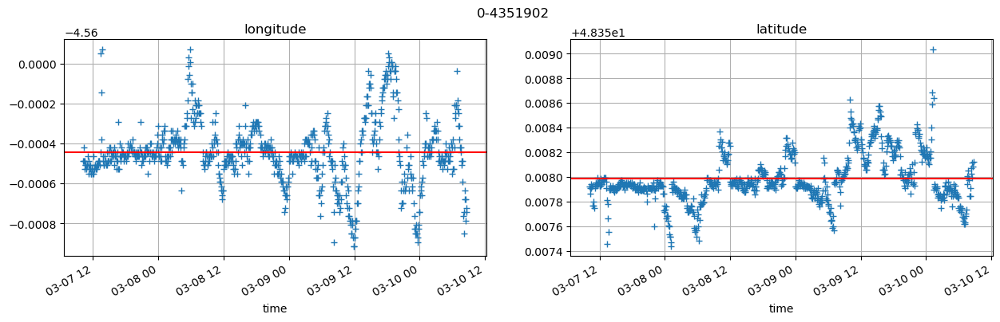

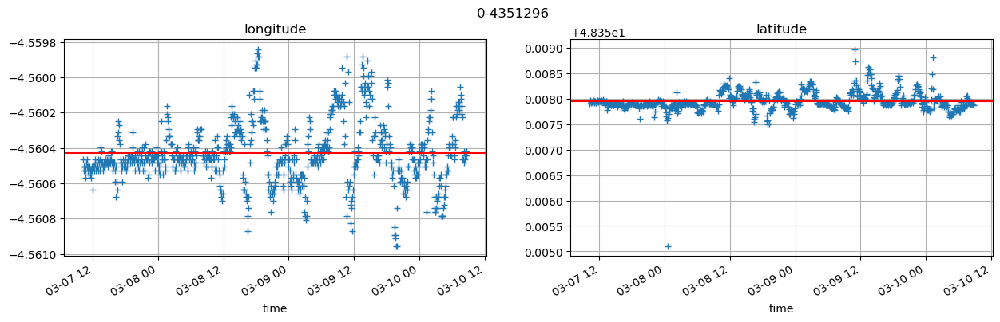

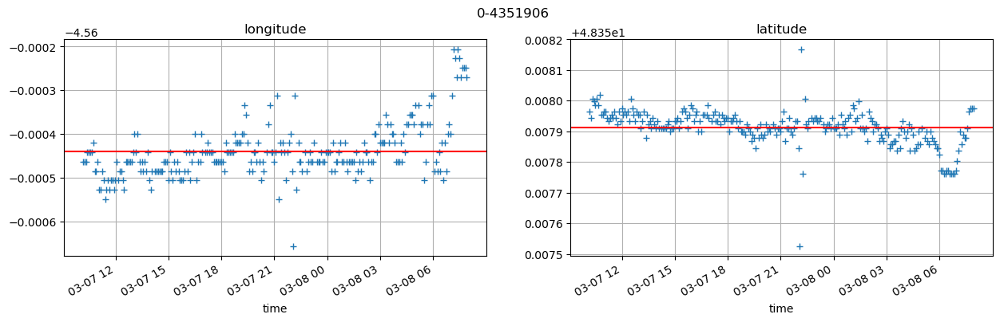

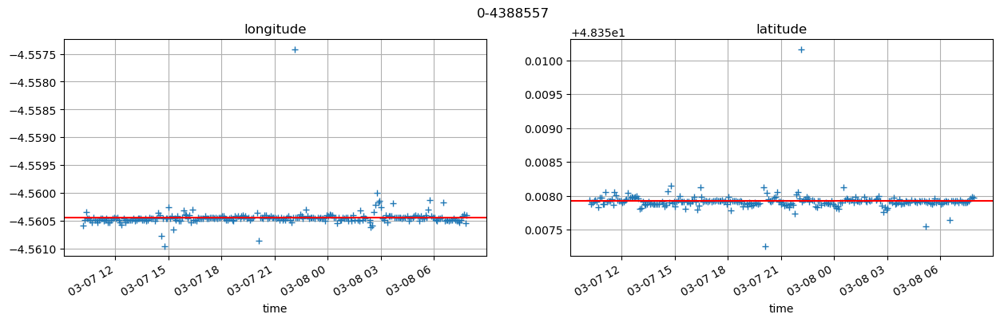

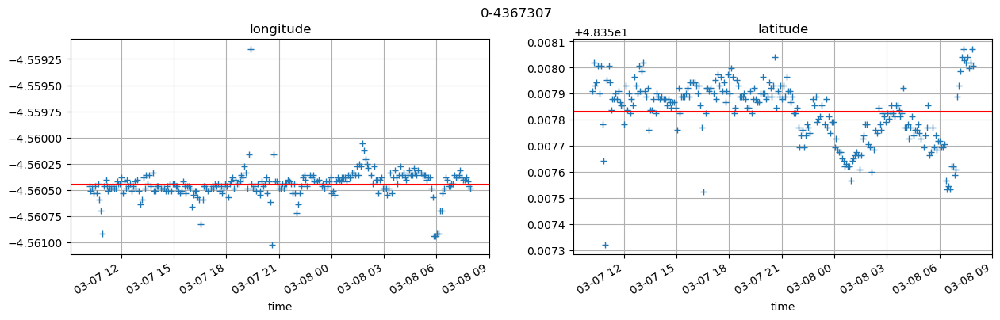

...

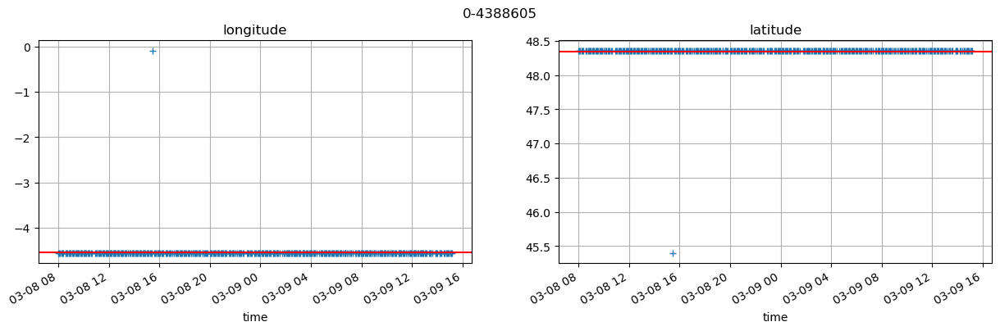

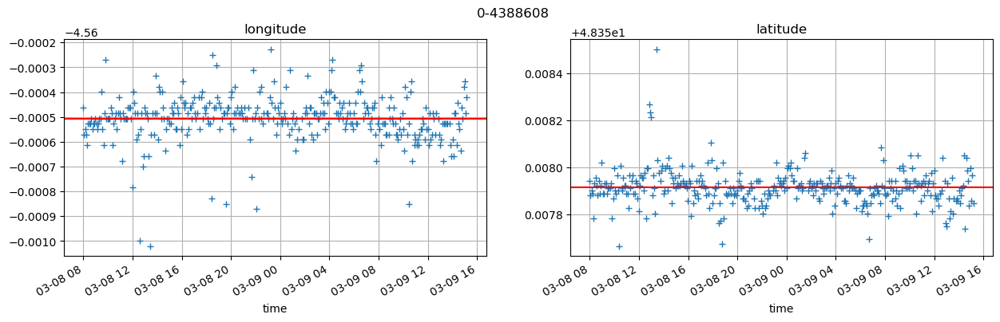

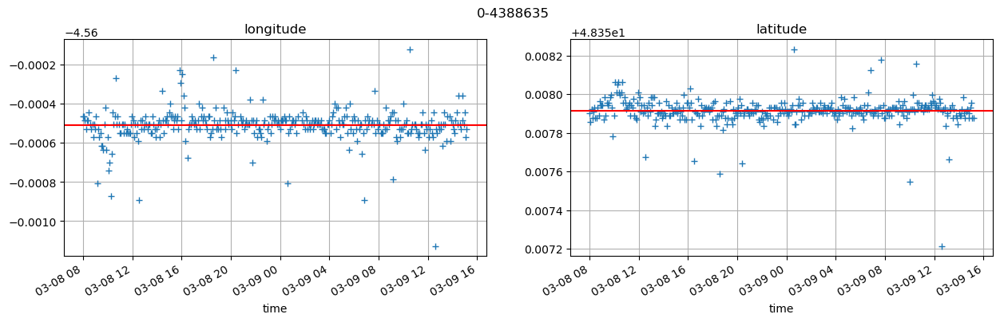

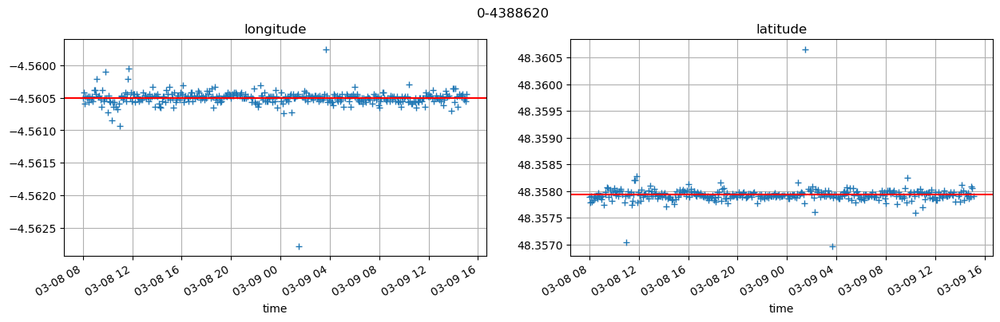

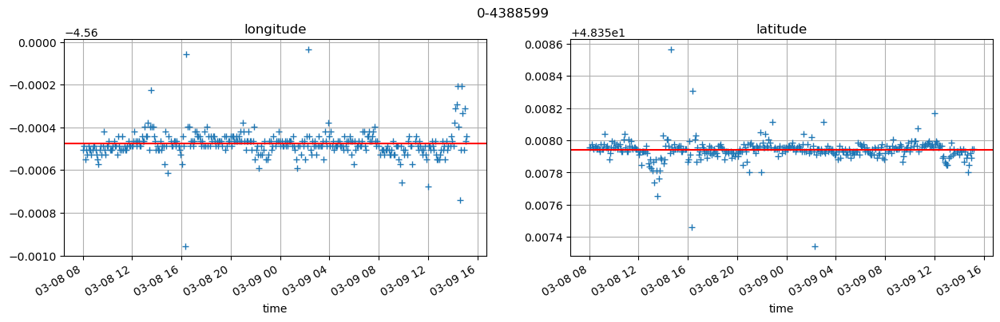

In [11]:
for id_ in ids:
    fig, ax = plt.subplots(1, 2, figsize=(15,4))
    df_=df[df.id==id_]
    df_.longitude.plot(ls='', marker='+', ax=ax[0])
    df_.latitude.plot(ls='', marker='+', ax=ax[1])
    ax[0].axhline(df_.longitude.mean(), color = 'r')
    ax[1].axhline(df_.latitude.mean(), color ='r')
    for a in ax :
        a.grid()
    ax[0].set_title('longitude')
    ax[1].set_title('latitude')
    fig.suptitle(id_)

_____
## Identifying and removing one aberant value

In [12]:
df.sort_values('dlon', ascending=False)

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude,dt,dlon,dlat
time,,,,,,,,,,,
2023-03-08 15:28:49,0-4388605,GOOD,0-4388605,0,0,3,45.398147,-0.086088,297.0,4.461552,-2.951260
2023-03-07 22:07:12,0-4388557,GOOD,0-4388557,0,0,3,48.360164,-4.557416,304.0,0.003023,0.002242
2023-03-07 19:22:06,0-4367307,GOOD,0-4367307,0,0,3,48.357879,-4.559154,329.0,0.001291,0.000047
2023-03-09 03:39:24,0-4388620,GOOD,0-4388620,0,0,3,48.356967,-4.559755,277.0,0.000749,-0.000965
2023-03-07 10:13:11,0-4356456,GOOD,0-4356456,0,0,3,48.358651,-4.559820,NaN,0.000645,0.000758
...,...,...,...,...,...,...,...,...,...,...,...
2023-03-08 17:09:15,0-4388605,GOOD,0-4388605,0,0,3,48.358007,-4.560935,604.0,-0.013295,0.008600
2023-03-08 17:14:46,0-4388605,GOOD,0-4388605,0,0,3,48.358050,-4.560957,331.0,-0.013317,0.008643
2023-03-08 23:45:47,0-4388605,GOOD,0-4388605,0,0,3,48.357664,-4.560978,357.0,-0.013338,0.008257


In [13]:
df =df[df.dlon<4]

_____
## Re-compute dlon dlat with new mean

In [14]:
df.longitude.max()

-4.557416

In [15]:
def compute_dt(df) : 
    df = df.copy()
    t = df.index.to_series()
    dt = t.diff()/ pd.Timedelta("1s")
    dt.index = df.index
    df.loc[:, "dt"] = dt
    return df
def compute_dlonlat(df):
    df = df.copy()
    lonm = df.longitude.mean()
    latm = df.latitude.mean()
    df.loc[:, "dlon"] = df.longitude - lonm
    df.loc[:, "dlat"] = df.latitude - latm
    return df
df = df.groupby('id').apply(compute_dt)
df = df.groupby('id').apply(compute_dlonlat)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_3183/1964030574.py:15: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('id').apply(compute_dt)
/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_3183/1964030574.py:16: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  

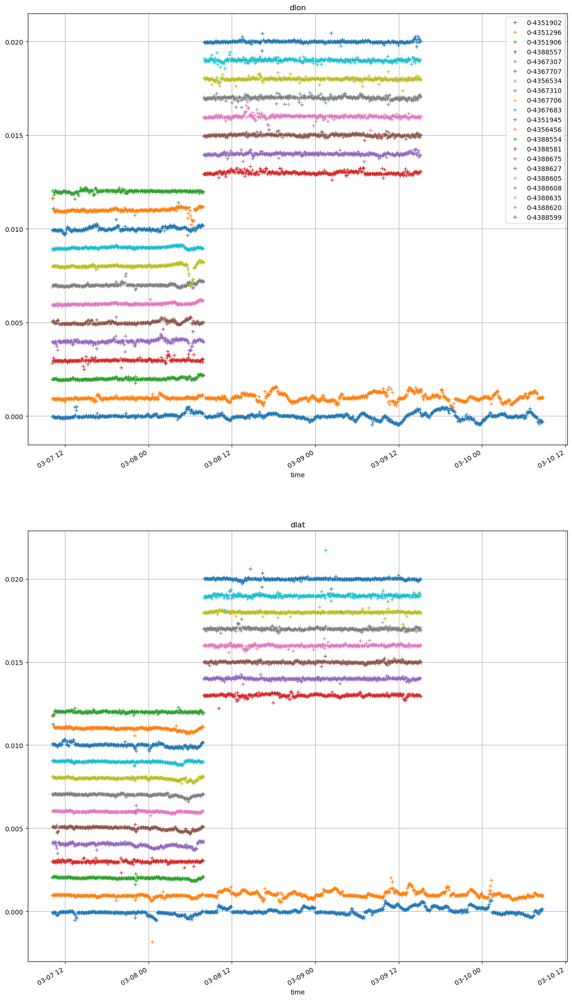

In [16]:
fig, ax = plt.subplots(2, 1, figsize=(15,30))
i=0
for id_ in ids:
    df_=df[df.id==id_]
    (df_.dlon+i).plot(ls='', marker='+', ax=ax[0], label=id_)
    (df_.dlat+i).plot(ls='', marker='+', ax=ax[1])
    i+=1e-3
    for a in ax :
        a.grid()
    ax[0].set_title('dlon')
    ax[1].set_title('dlat')
    ax[0].legend()

## Can we refind buoys place with mean lon, lat ? 


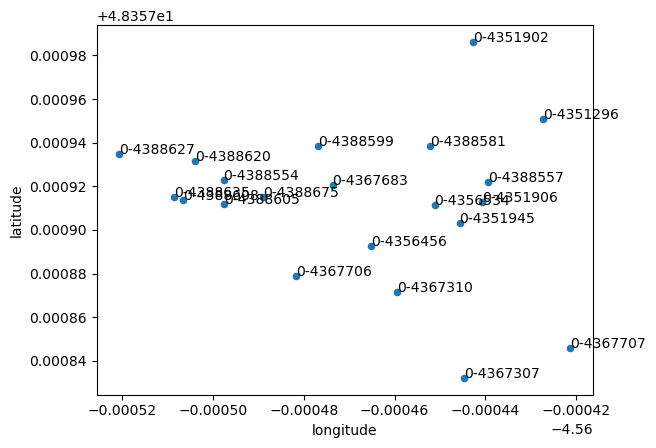

In [67]:
df_mean = df[['latitude','longitude','id']].groupby('id').mean()
df_mean.plot.scatter('longitude', 'latitude')
for id_ in ids : 
    dfm_=df_mean.loc[id_,:]
    plt.annotate(id_, (dfm_.longitude, dfm_.latitude))

In [39]:
def geo_plot(df, list_id, title="", legend="", **kwargs):
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.EckertIII(central_longitude=-180))
    #ax.add_feature(cfeature.LAND, zorder=2)
    
    lat_min, lat_max = df[df.longitude!=0].longitude.min(), df[df.longitude!=0].longitude.max()
    lon_min, lon_max = df[df.latitude!=0].latitude.min(), df[df.latitude!=0].latitude.max()
    for id_ in list_id:
        df_ = (
            df[df.id==id_][["longitude", "latitude"]]
        )
        lon = np.array(df_.longitude)
        lat = np.array(df_.latitude)
        ax.scatter(
            lon, lat, marker=".", s=3, transform=ccrs.PlateCarree(), label=str(id_)
        )
    lat_med = df.latitude.median()
    lon_med = df.longitude.median()  
    lon_ex = 1e-3
    lat_ex = 1e-3
    ax.set_extent(np.array([lon_med-lon_ex, lon_med+lon_ex, lat_med-3*lat_ex, lat_med+lat_ex])+1e-3, ccrs.PlateCarree())
    ax.set_title(title, fontsize=15)
    gl = ax.gridlines(
        draw_labels=True,
    )
    print([lon_min, lon_max, lat_min, lat_max])
    fig.legend()

In [40]:
i=4
df_ = df[df.id==id_]
hvplot = (df[df.id==ids[i+0]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+0])
          * df[df.id==ids[i+1]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+1])
          * df[df.id==ids[i+2]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+2])
          * df[df.id==ids[i+3]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+3])
          * df[df.id==ids[i+4]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+4])
          + df[df.id==ids[i+0]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+0])
          * df[df.id==ids[i+1]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+1])
          * df[df.id==ids[i+2]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+2])
          * df[df.id==ids[i+3]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+3])
          * df[df.id==ids[i+4]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+4]))
layout = hv.Layout(hvplot).cols(1)
layout

:Layout
   .Overlay.I  :Overlay
      .Scatter.A_0_hyphen_minus_4367307 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4367707 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4356534 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4367310 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4367706 :Scatter   [time]   (longitude)
   .Overlay.II :Overlay
      .Scatter.A_0_hyphen_minus_4367307 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4367707 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4356534 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4367310 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4367706 :Scatter   [time]   (latitude)

[48.3551, 48.360657, -4.562781, -4.557416]


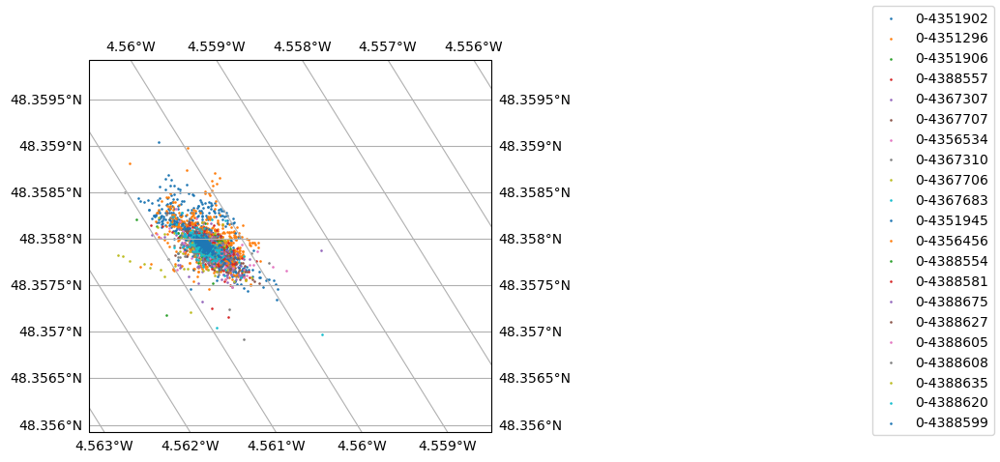

In [41]:
geo_plot(df, ids)

---

## Histograms

Même erreurs lon, lat, erreurs centrées sur 0, par d'erreur systématique  

Odg $10^{-4}$°   

Mean values (lon, lat) : 3.6121510812069835e-17 , 1.3279185513253232e-15  

Std : 0.00012671462724336786, 0.00012689579557938354

In [42]:
print(abs(df.dlon).max(), abs(df.dlat).max())
print(abs(df.dlon).min(), abs(df.dlat).min())
print(abs(df.dlon).quantile(0.999), abs(df.dlat).quantile(0.999))

0.003023460317460369 0.0028509150717681564
6.288088645334255e-07 1.9841266407638614e-08
0.0009696252283469767 0.0009585544871533075


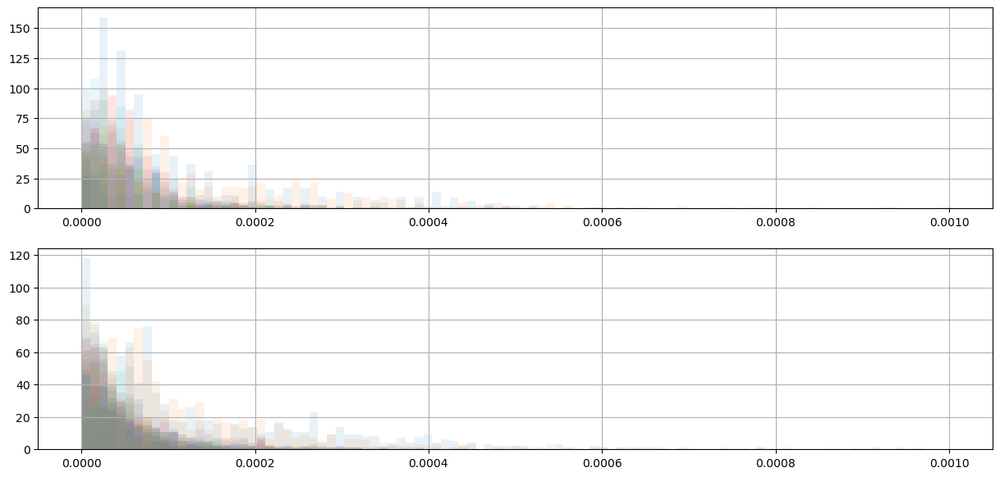

In [43]:
bins = np.linspace(0, 0.001, 100)
fig, ax = plt.subplots(2, 1, figsize=(15,7))
for id_ in ids :
    df_ = df[df.id==id_]
    abs(df_.dlon).hist(ax=ax[0], label = id_, alpha=0.1, bins=bins)
    abs(df_.dlat).hist(ax=ax[1], label = id_, alpha=0.1, bins=bins)

In [44]:
print(df.longitude.max(), df.latitude.max())
print(df.longitude.min(), df.latitude.min())
print(df.longitude.quantile(0.001),df.longitude.quantile(0.999))
print(df.latitude.quantile(0.005),df.latitude.quantile(0.995))

-4.557416 48.360657
-4.562781 48.3551
-4.561363536 -4.559848722
48.357554305 48.35845239


(48.357546, 48.35845228)

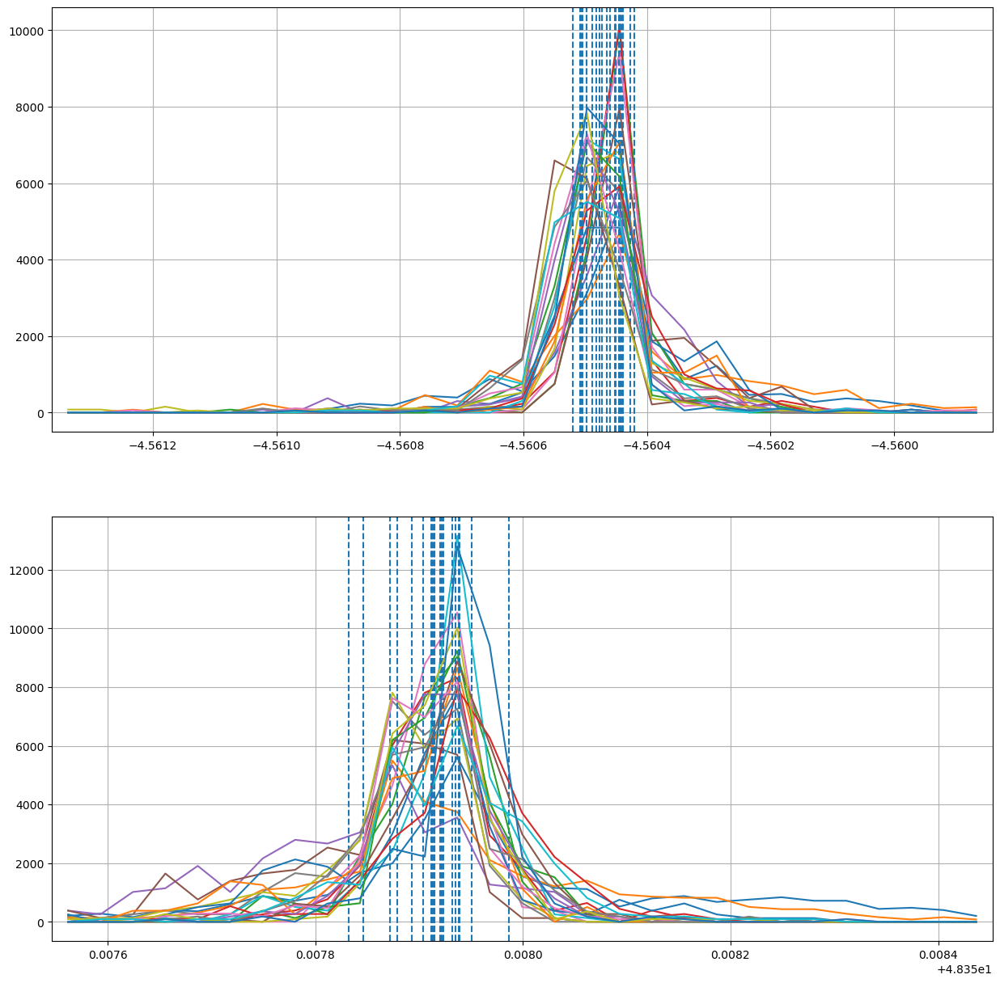

In [46]:
bins_lon = np.linspace(-4.561363472,-4.559841, 30)
bins_lat = np.linspace(48.357546, 48.35845228,  30)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
for id_ in ids :
    #fig, ax = plt.subplots(2, 1, figsize=(15,7))
    df_ = df[df.id==id_]
    hist_lon = np.histogram(df_.longitude, bins_lon, density=True)
    hist_lat = np.histogram(df_.latitude, bins_lat, density=True)
    ax[0].plot(bins_lon[:-1] + np.diff(bins_lon)/2, hist_lon[0], label = id_)
    ax[1].plot(bins_lat[:-1] + np.diff(bins_lat)/2, hist_lat[0], label = id_)
    ax[0].axvline(df_.longitude.mean(), ls='--')
    ax[1].axvline(df_.latitude.mean(), ls='--')
for a in ax :
    a.grid()
ax[0].set_xlim(-4.561363472,-4.559841)
ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

In [ ]:
dlodf.dl

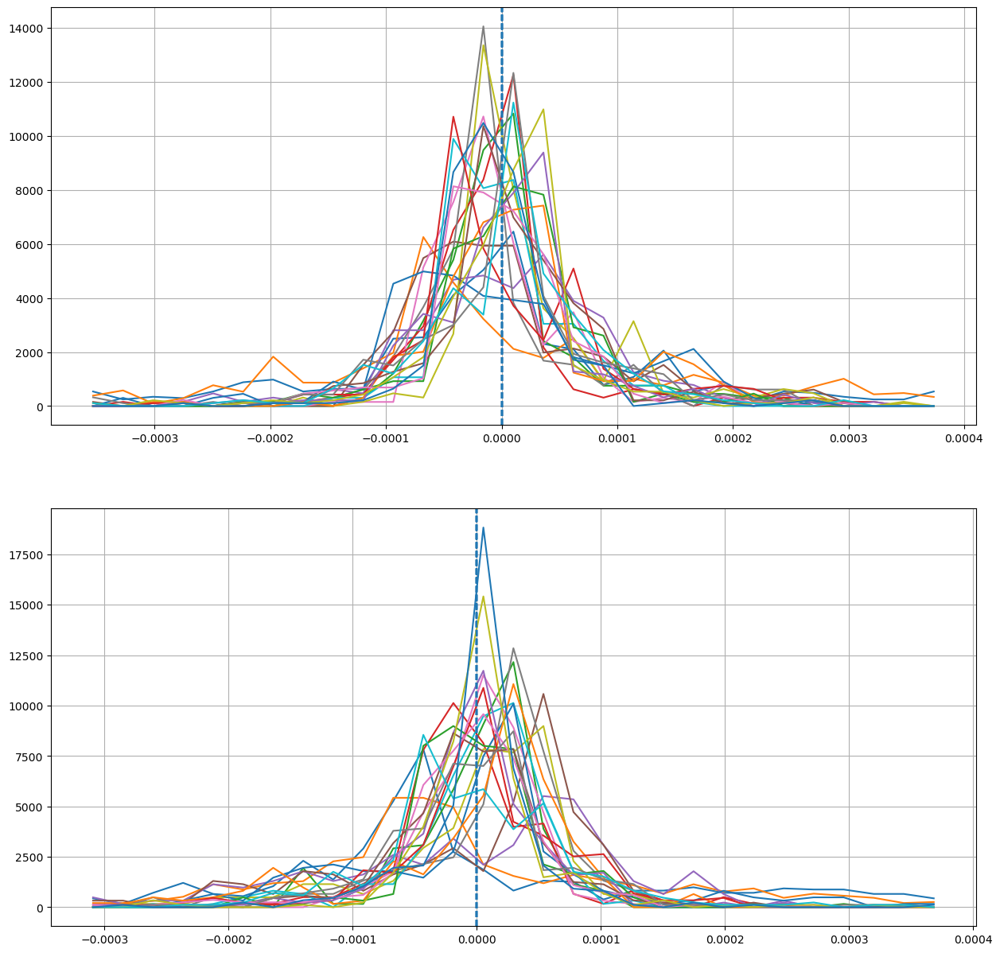

In [27]:
dlon_min, dlon_max = df.dlon.quantile(0.01), df.dlon.quantile(0.99)
dlat_min, dlat_max = df.dlat.quantile(0.01), df.dlat.quantile(0.99)
bins_dlon = np.linspace(dlon_min, dlon_max, 30)
bins_dlat = np.linspace(dlat_min, dlat_max , 30)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
for id_ in ids :
    #fig, ax = plt.subplots(2, 1, figsize=(15,7))
    df_ = df[df.id==id_]
    hist_lon = np.histogram(df_.dlon, bins_dlon, density=True)
    hist_lat = np.histogram(df_.dlat, bins_dlat, density=True)
    ax[0].plot(bins_dlon[:-1] + np.diff(bins_dlon)/2, hist_lon[0], label = id_)
    ax[1].plot(bins_dlat[:-1] + np.diff(bins_dlat)/2, hist_lat[0], label = id_)
    ax[0].axvline(df_.dlon.mean(), ls='--')
    ax[1].axvline(df_.dlat.mean(), ls='--')
for a in ax :
    a.grid()
#ax[0].set_xlim(-4.561363472,-4.559841)
#ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

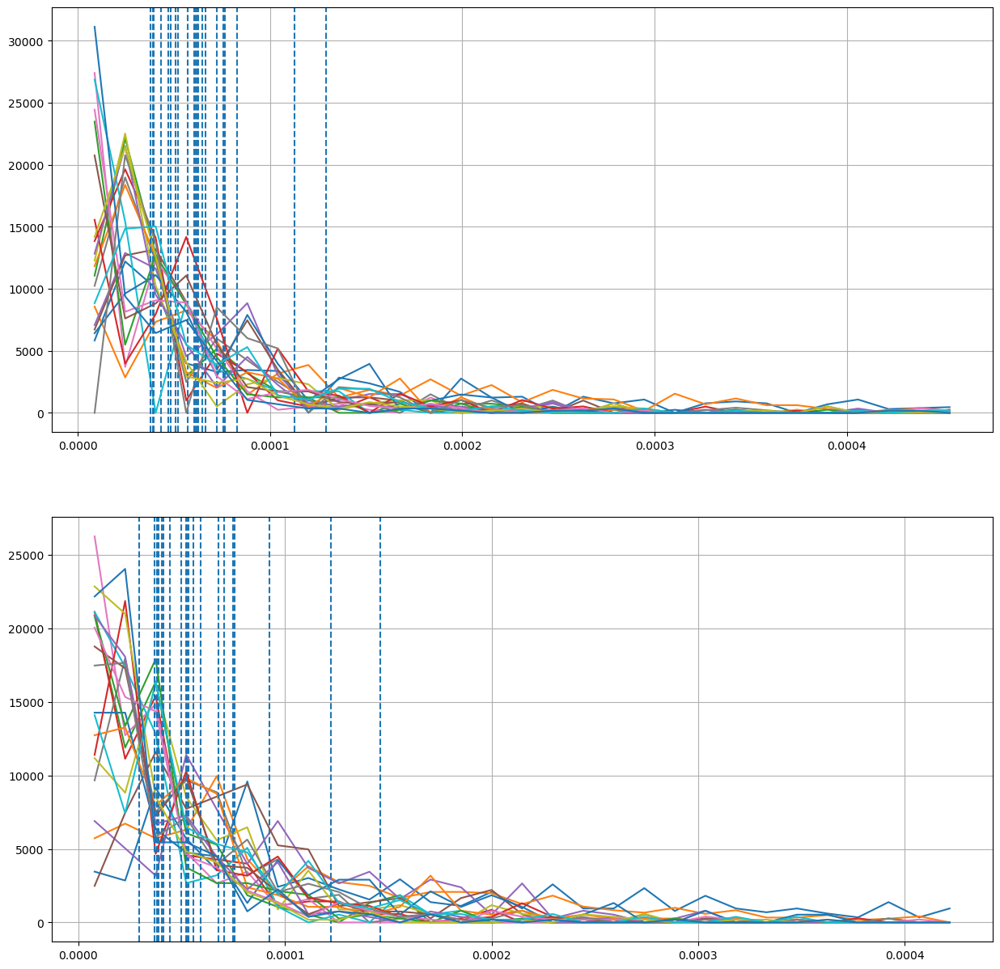

In [28]:
dlon_min, dlon_max = abs(df.dlon).quantile(0.01), abs(df.dlon).quantile(0.99)
dlat_min, dlat_max = abs(df.dlat).quantile(0.01), abs(df.dlat).quantile(0.99)
bins_dlon = np.linspace(dlon_min, dlon_max, 30)
bins_dlat = np.linspace(dlat_min, dlat_max , 30)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
for id_ in ids :
    #fig, ax = plt.subplots(2, 1, figsize=(15,7))
    df_ = df[df.id==id_]
    hist_lon = np.histogram(abs(df_.dlon), bins_dlon, density=True)
    hist_lat = np.histogram(abs(df_.dlat), bins_dlat, density=True)
    ax[0].plot(bins_dlon[:-1] + np.diff(bins_dlon)/2, hist_lon[0], label = id_)
    ax[1].plot(bins_dlat[:-1] + np.diff(bins_dlat)/2, hist_lat[0], label = id_)
    ax[0].axvline(abs(df_.dlon).mean(), ls='--')
    ax[1].axvline(abs(df_.dlat).mean(), ls='--')
for a in ax :
    a.grid()
#ax[0].set_xlim(-4.561363472,-4.559841)
#ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

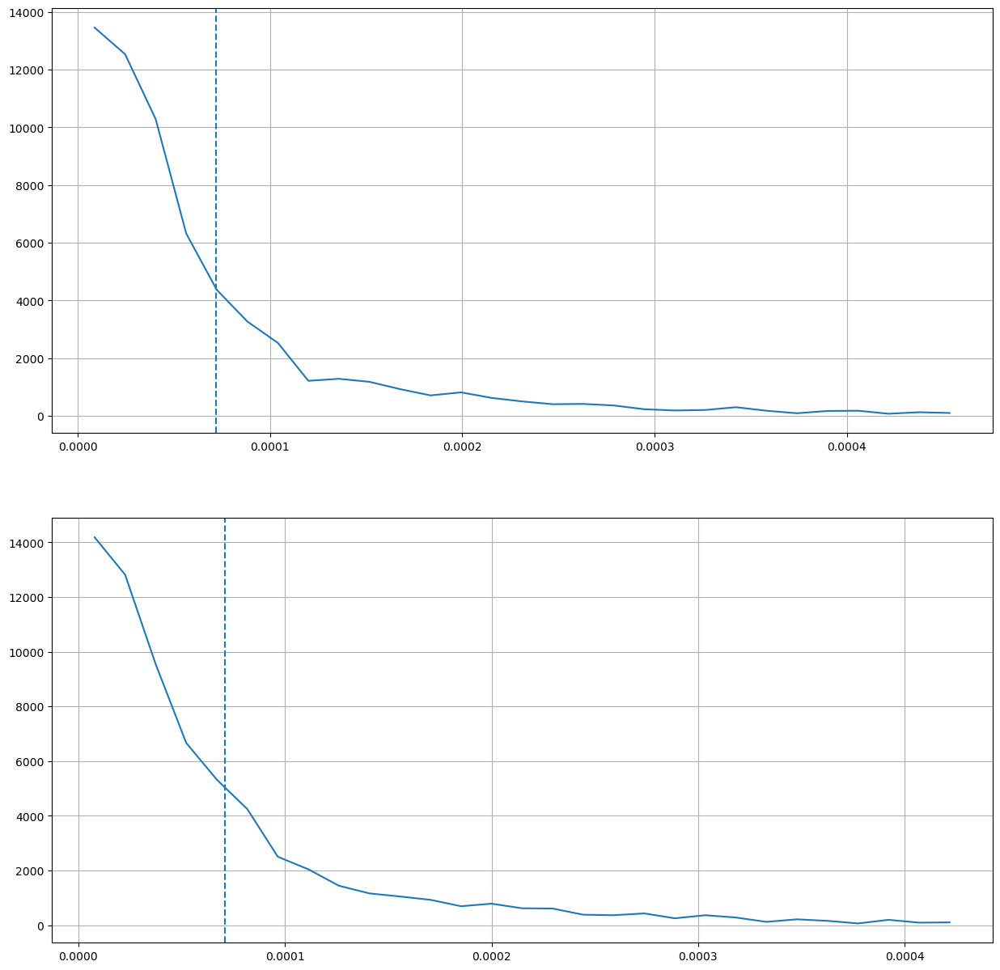

In [29]:
dlon_min, dlon_max = abs(df.dlon).quantile(0.01), abs(df.dlon).quantile(0.99)
dlat_min, dlat_max = abs(df.dlat).quantile(0.01), abs(df.dlat).quantile(0.99)
bins_dlon = np.linspace(dlon_min, dlon_max, 30)
bins_dlat = np.linspace(dlat_min, dlat_max , 30)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
hist_lon = np.histogram(abs(df.dlon), bins_dlon, density=True)
hist_lat = np.histogram(abs(df.dlat), bins_dlat, density=True)
ax[0].plot(bins_dlon[:-1] + np.diff(bins_dlon)/2, hist_lon[0], label = id_)
ax[1].plot(bins_dlat[:-1] + np.diff(bins_dlat)/2, hist_lat[0], label = id_)
ax[0].axvline(abs(df.dlon).mean(), ls='--')
ax[1].axvline(abs(df.dlat).mean(), ls='--')
for a in ax :
    a.grid()
#ax[0].set_xlim(-4.561363472,-4.559841)
#ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

3.6121510812069835e-17
1.3279185513253232e-15
0.00012671462724336786
0.00012689579557938354


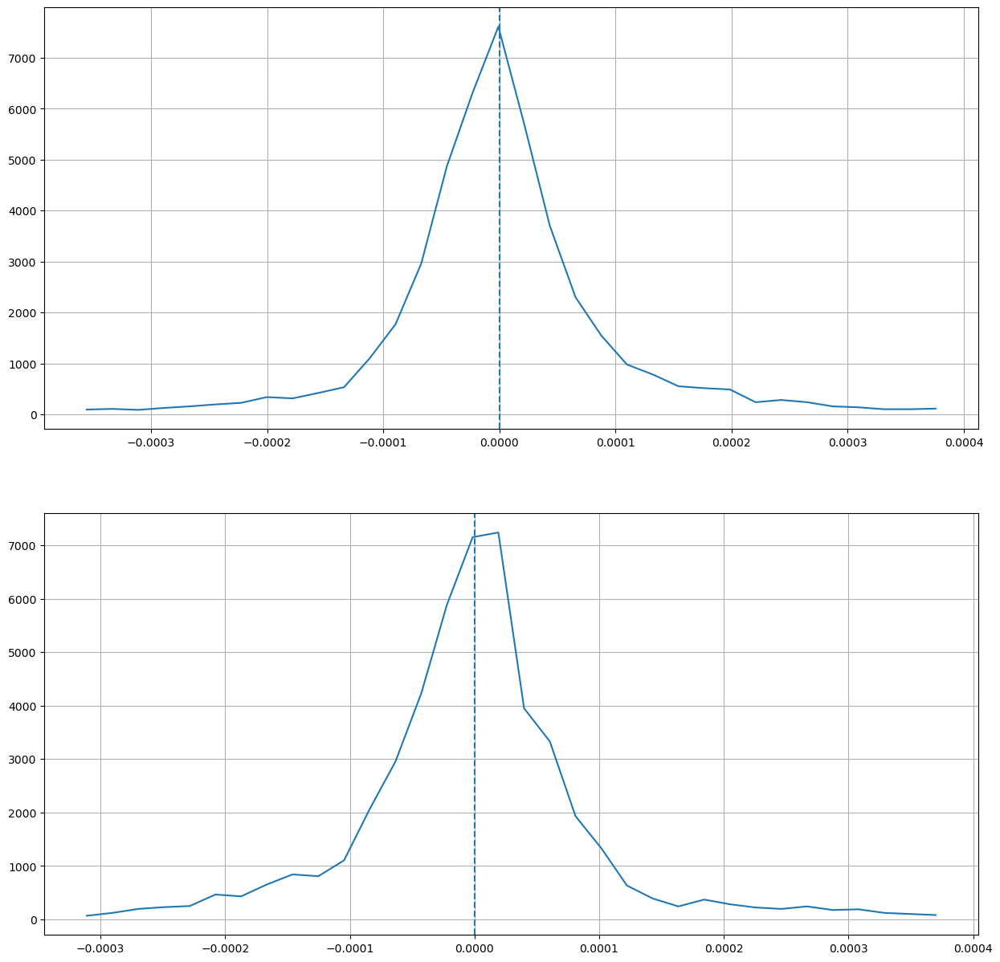

In [42]:
dlon_min, dlon_max = df.dlon.quantile(0.01), df.dlon.quantile(0.99)
dlat_min, dlat_max = df.dlat.quantile(0.01), df.dlat.quantile(0.99)
bins_dlon = np.linspace(dlon_min, dlon_max, 35)
bins_dlat = np.linspace(dlat_min, dlat_max ,35)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
hist_lon = np.histogram(df.dlon, bins_dlon, density=True)
hist_lat = np.histogram(df.dlat, bins_dlat, density=True)
ax[0].plot(bins_dlon[:-1] + np.diff(bins_dlon)/2, hist_lon[0], label = id_)
ax[1].plot(bins_dlat[:-1] + np.diff(bins_dlat)/2, hist_lat[0], label = id_)
ax[0].axvline(df.dlon.mean(), ls='--')
ax[1].axvline(df.dlat.mean(), ls='--')
print(df.dlon.mean())
print(df.dlat.mean())
print(df.dlon.std())
print(df.dlat.std())
for a in ax :
    a.grid()
#ax[0].set_xlim(-4.561363472,-4.559841)
#ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

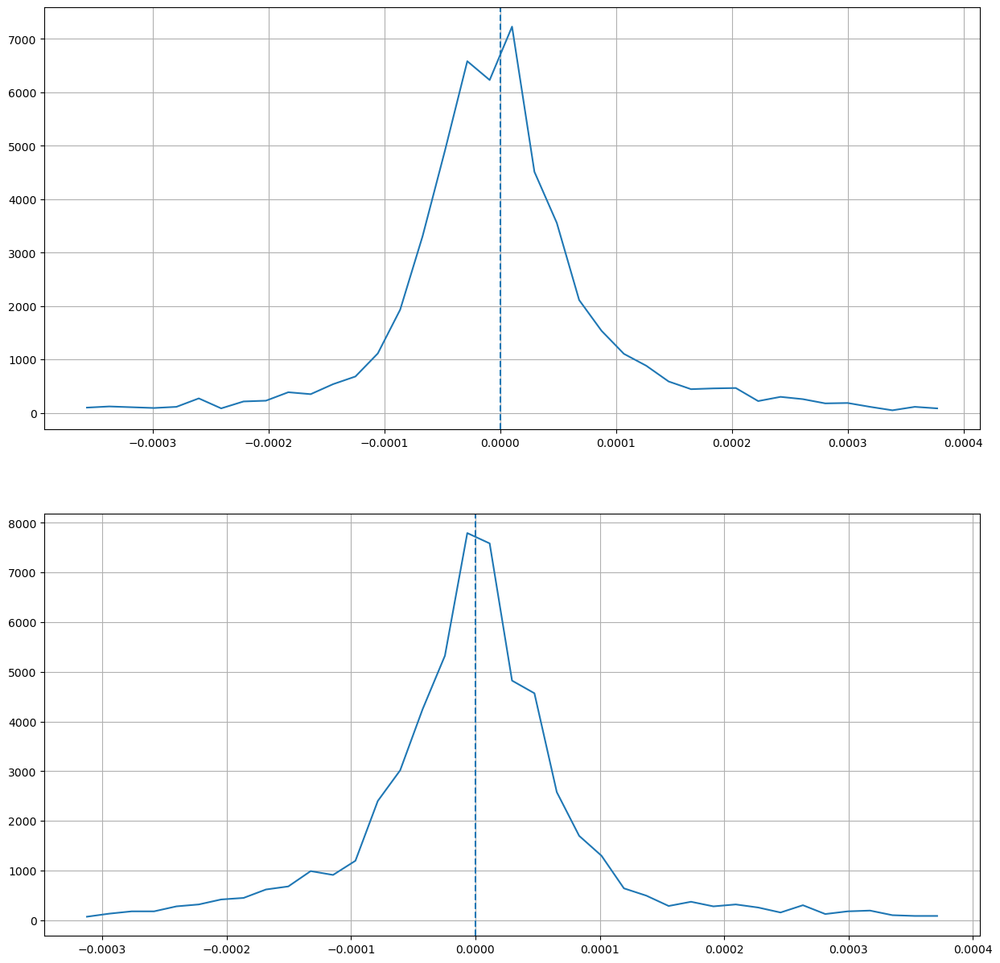

In [41]:
dlon_min, dlon_max = df.dlon.quantile(0.01), df.dlon.quantile(0.99)
dlat_min, dlat_max = df.dlat.quantile(0.01), df.dlat.quantile(0.99)
bins_dlon = np.linspace(dlon_min, dlon_max, 40)
bins_dlat = np.linspace(dlat_min, dlat_max ,40)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
hist_lon = np.histogram(df.dlon, bins_dlon, density=True)
hist_lat = np.histogram(df.dlat, bins_dlat, density=True)
ax[0].plot(bins_dlon[:-1] + np.diff(bins_dlon)/2, hist_lon[0], label = id_)
ax[1].plot(bins_dlat[:-1] + np.diff(bins_dlat)/2, hist_lat[0], label = id_)
ax[0].axvline(df.dlon.mean(), ls='--')
ax[1].axvline(df.dlat.mean(), ls='--')
for a in ax :
    a.grid()
#ax[0].set_xlim(-4.561363472,-4.559841)
#ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

___
## dt
Minima are jus after maxima

In [24]:
i=4
df_ = df[df.id=='0-4388557']
hvplot = (df_.dt.hvplot(grid=True, kind="scatter") 
          + df_.dlon.hvplot(grid=True, kind="scatter")
          + df_.dlat.hvplot(grid=True, kind="scatter"))

layout = hv.Layout(hvplot).cols(1)
layout

:Layout
   .Scatter.Dt   :Scatter   [time]   (dt)
   .Scatter.Dlon :Scatter   [time]   (dlon)
   .Scatter.Dlat :Scatter   [time]   (dlat)

<AxesSubplot: xlabel='time'>

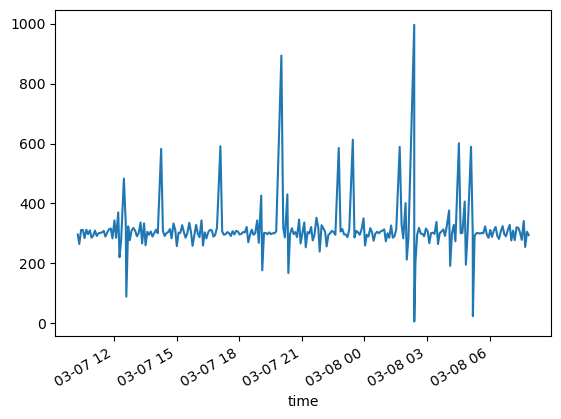

In [23]:
df[df.id=='0-4388557'].dt.plot()

---

## xarray

In [ ]:
ds = df.reset_index().set_index(['id', 'time']).to_xarray().rename({'id':'id_'})

In [22]:
ds

<xarray.Dataset>
Dimensions:           (id_: 21, time: 7189)
Coordinates:
  * id_               (id_) object '0-4351296' '0-4351902' ... '0-4388675'
  * time              (time) datetime64[ns] 2023-03-07T10:10:14 ... 2023-03-1...
Data variables:
    BatteryStatus     (id_, time) object nan nan nan nan nan ... nan nan nan nan
    CommId            (id_, time) object nan nan nan nan nan ... nan nan nan nan
    GPS Confidence    (id_, time) float64 nan nan nan nan ... nan nan nan nan
    GPS Fail Counter  (id_, time) float64 nan nan nan nan ... nan nan nan nan
    GpsQuality        (id_, time) float64 nan nan nan nan ... nan nan nan nan
    latitude          (id_, time) float64 nan nan nan nan ... nan nan nan nan
    longitude         (id_, time) float64 nan nan nan nan ... nan nan nan nan

In [20]:
ds.isel(id_ = 0).plot.scatter('longitude', 'latitude')

Locator attempting to generate 7189 ticks ([1, ..., 14377]), which exceeds Locator.MAXTICKS (1000).


Error in callback <function _draw_all_if_interactive at 0x16389bc10> (for post_execute):



KeyboardInterrupt

Locator attempting to generate 7189 ticks ([1, ..., 14377]), which exceeds Locator.MAXTICKS (1000).


Error in callback <function flush_figures at 0x16389b1f0> (for post_execute):



KeyboardInterrupt



In [11]:
ds=df.to_xarray()

ds

<xarray.Dataset>
Dimensions:           (id: 7368)
Coordinates:
  * id                (id) object '0-4351296' '0-4351296' ... '0-4388675'
Data variables:
    time              (id) datetime64[ns] 2023-03-10T08:44:45 ... 2023-03-08T...
    BatteryStatus     (id) object 'GOOD' 'GOOD' 'GOOD' ... 'GOOD' 'GOOD' 'GOOD'
    CommId            (id) object '0-4351296' '0-4351296' ... '0-4388675'
    GPS Confidence    (id) int64 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    GPS Fail Counter  (id) int64 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    GpsQuality        (id) int64 3 3 3 3 3 3 3 3 3 3 3 ... 3 3 3 3 3 3 3 3 3 3 3
    latitude          (id) float64 48.36 48.36 48.36 48.36 ... 48.36 48.36 48.36
    longitude         (id) float64 -4.56 -4.56 -4.56 ... -4.561 -4.56 -4.56